In [1]:
from pathlib import Path
from IPython.display import Image, display, Markdown

# Group 14 Final: 

This project uses the CalEnviroScreen 4.0 dataset, released by the California Office of Environmental Health Hazard Assessment (OEHHA). The dataset provides census-tract–level information across California, integrating a wide range of environmental pollution indicators and socioeconomic vulnerability measures. Environmental indicators include ozone, fine particulate matter (PM2.5), traffic density, pesticide use, and toxic releases, which together characterize pollution burden. Socioeconomic and population characteristics include educational attainment, poverty rates, and demographic composition by race and ethnicity, including the proportions of Hispanic, White, African American, and other racial groups. In addition to individual indicators, the dataset includes composite CalEnviroScreen scores and percentiles that summarize cumulative environmental and social disadvantage. 

## Chart Visualizations:

We sought to reproduce the charts of 'Analysis of Race/Ethnicity and CalEnviroScreen 4.0 Scores' report. 

**Figure 1. CalEnviroScreen 4.0 Score by Racial or Ethnic Group**

![original figure 1](visualizations/descriptive_charts/reported_fig1.png)

The original report generated this figure using individual-level data, where each observation represents a single Californian. With this structure, they were able to assign each person a CalEnviroScreen 4.0 percentile score based on their census tract and then group individuals by race/ethnicity to compute the accurate score distribution for each group.

However, our dataset is at the county level. While we had the total population data, generating the long-format dataset by repeatedly appending observations was avoided due to high time consumption. Thus we approximately generated the boxplot by assigning each county to the race/ethnicity group with the highest proportion.

![reproduced figure 1](visualizations/descriptive_charts/fig1_majorityrace_BaW.png)

The comparison between the original figure 1 and the reproduced analysis confirms the severe structural environment injustice in California. The African American (corresponding to Black) and Hispanic (corresponding to Latino) groups shows the consistently highest median vulnerability score, and the White group shows the lowest. This indicates that Hispanic and African American populations tend to live in communities with higher pollution burdens and vulnerabilities than the other/racial/ethnic groups analyzed. \
\
However, the methodology used for the reproduction seemingly inflated the median scores significantly compared to the original report. Also, the extremely low count for the Native American group (n=4) makes its derived median unreliable for comparison purposes.

**Figure 2. Race in the Least and Most Impacted Census Tracts of CalEnviroScreen 4.0.**

![original figure 2](visualizations/descriptive_charts/reported_fig2.png) 

![reproduced figure 2](visualizations/descriptive_charts/fig2_topbottom_piechart.png)

**Figure 3. Racial Makeup of Each Decile of CalEnviroScreen 4.0 Score.**

![original figure 3](visualizations/descriptive_charts/reported_fig3.png)

![reproduced figure 3](visualizations/descriptive_charts/fig3_racialmakeupbydecile_barchart.png)

The results are consistent with the original conclusions, reaffirming the environmental racial inequity within California.
As environmental vulnerability increases (moving to higher deciles), the proportion of Hispanic and African American residents increases overwhelmingly. Conversely, the proportion of White residents decreases sharply as the disadvantage lessens, suggesting they predominantly reside in the most environmentally safe areas. This inequality is further highlighted when compared to the average bar representing the entire state of California at the bottom.

**Figure 4. Most prevalent race by census tracts were overlaid with most disadvantaged 10%
CalEnviroScreen scores.**

![original figure 4](visualizations/descriptive_charts/reported_fig4.png)

![reproduced figure 4](visualizations/descriptive_charts/fig4_top10perctracts_barchart.png)

We were able to reproduce the exact same numerical values as the original report. Although the proportion of African Americans appears small in Figure 3, the fact that 18% of counties where African Americans are the major racial group are environmentally vulnerable (21 out of 112 counties) is not that different from the Hispanic proportion. This shows why attention should be paid not only to Hispanics but also to African Americans.

**Additional Analysis**

Across key socioeconomic indicators—education, poverty, and linguistic isolation-, the correlation analysis shows that the Hispanic proportion exhibits consistently strong positive correlations with measures of disadvantage, with all correlation coefficients exceeding 0.7. In contrast, the White proportion shows consistently strong negative correlations with the same indicators, all exceeding -0.7 in magnitude. These relationships indicate that areas with a higher Hispanic population tend to have a larger proportion of residents with less than a high school education, higher poverty rates, and greater linguistic isolation, meaning more households with limited English proficiency. In contrast, areas with a higher White populations tend to have higher education levels and fewer linguistically isolated households.

![figure 5](visualizations/descriptive_charts/fig5_topbottom_educatP_piechart.png)

This relationship is especially pronounced at the lower end of the education distribution. In the 10% lowest education neighborhoods, the Hispanic population accounts for an average of 82%. This concentration is notably stronger than in neighborhoods grouped by other variables.

## Map Visualizations:

In this Map Visualization section, we present descriptive maps illustrating the spatial distribution of racial composition and cumulative environmental burden across geographic units. Race share maps display the proportion of each racial group using fixed bins to allow consistent comparisons across space. The bivariate maps jointly visualize race share and the CalEnviroScreen composite score (CIscore), which captures cumulative environmental burden by combining pollution exposure which is derived from factors such as pesticide use, ozone levels, traffic, and other environmental stressors with population characteristics. Finally, the overlap hotspot maps highlight areas that fall simultaneously in the upper tail of both race share and CIscore, identifying locations where higher concentrations of specific racial groups coincide with elevated cumulative environmental burden.

## Race share (fixed bins)

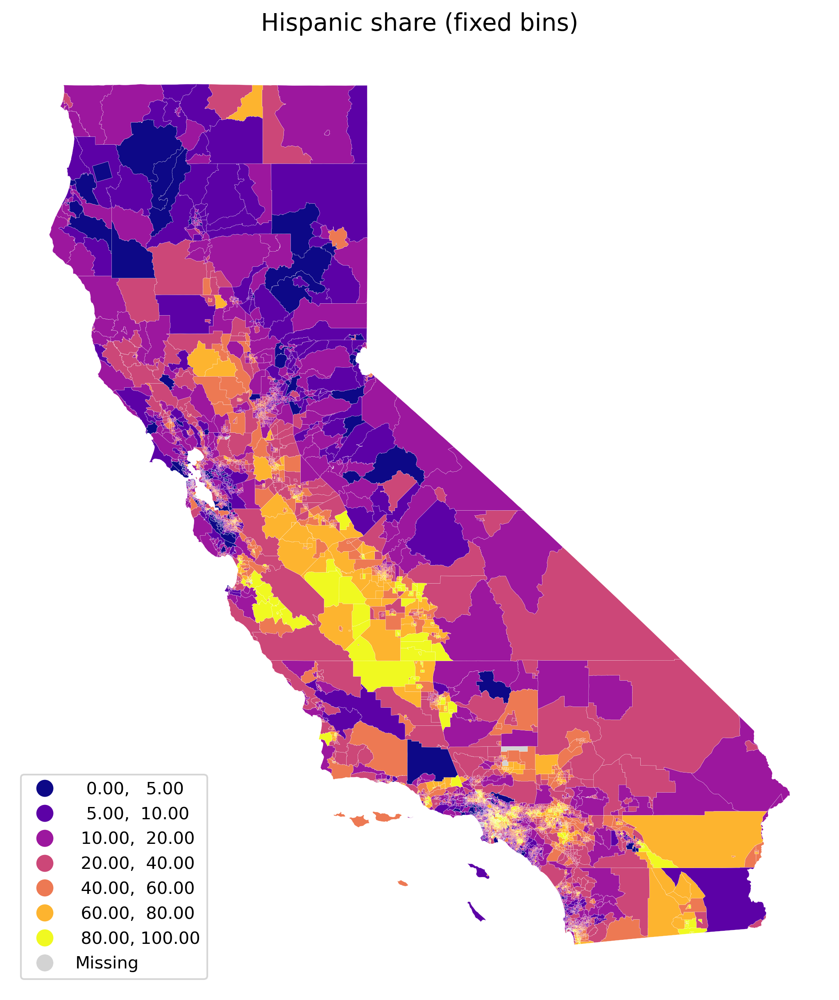

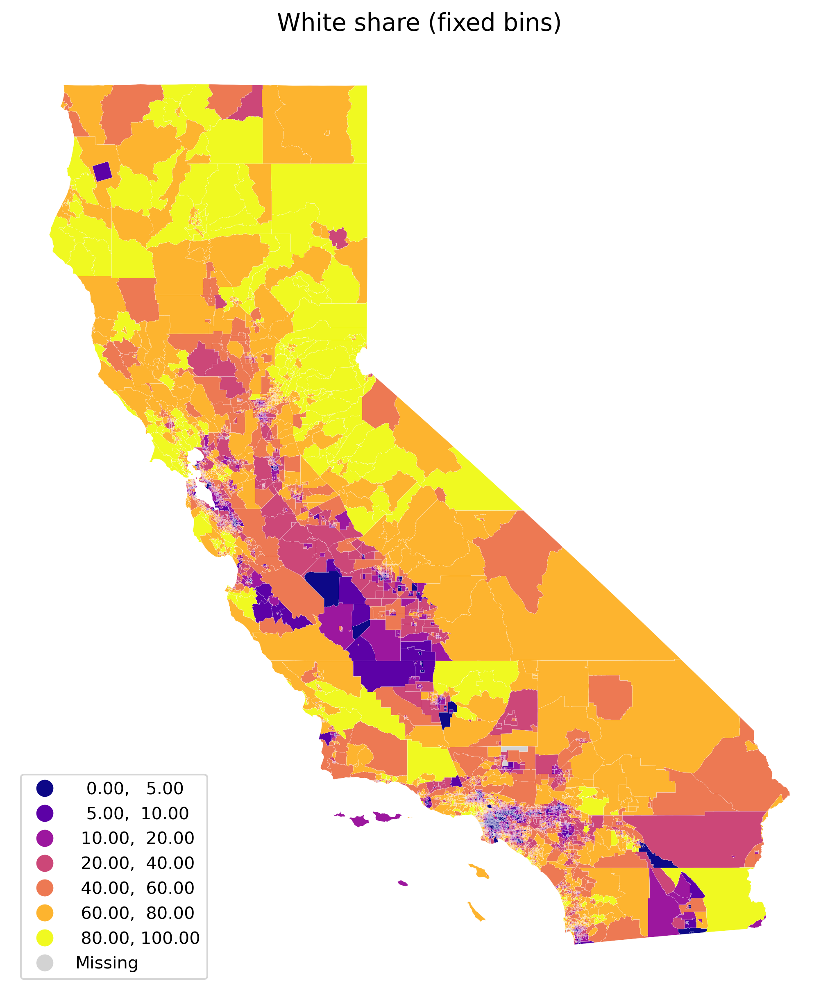

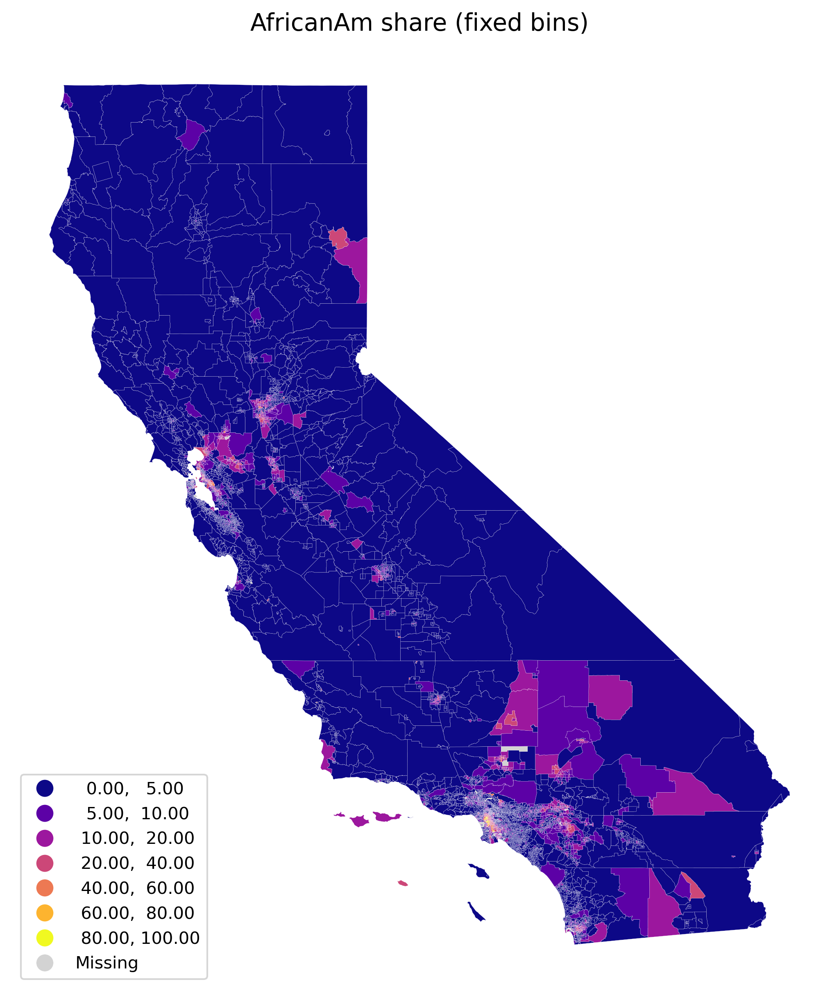

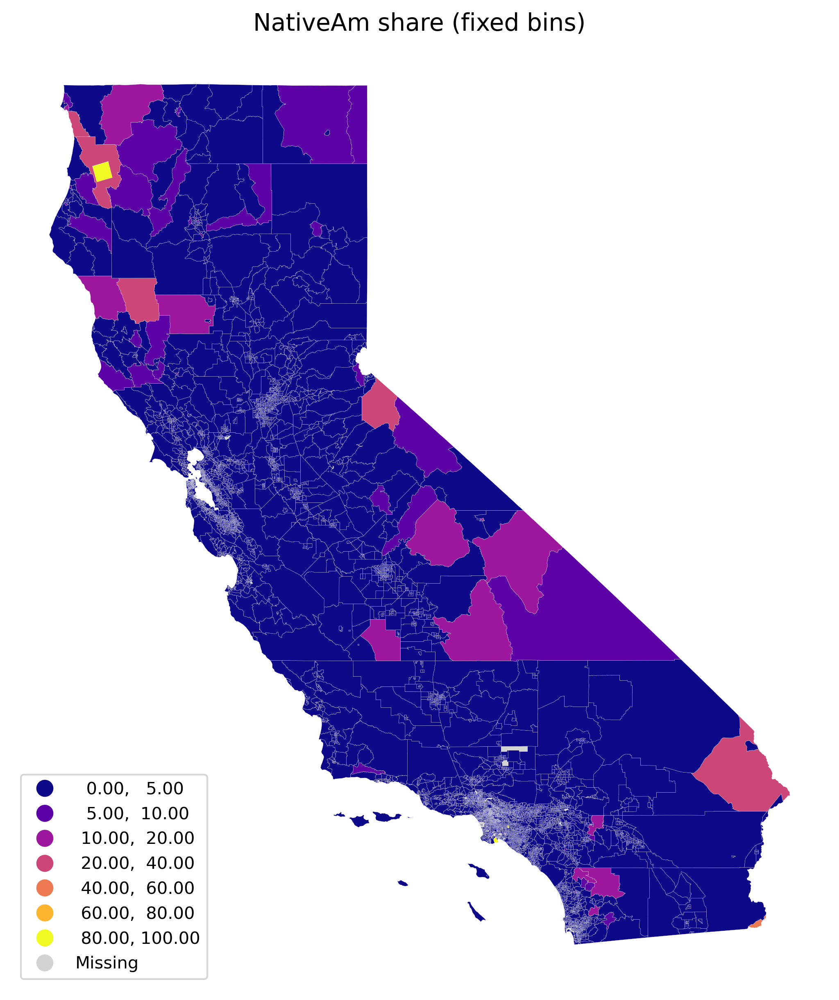

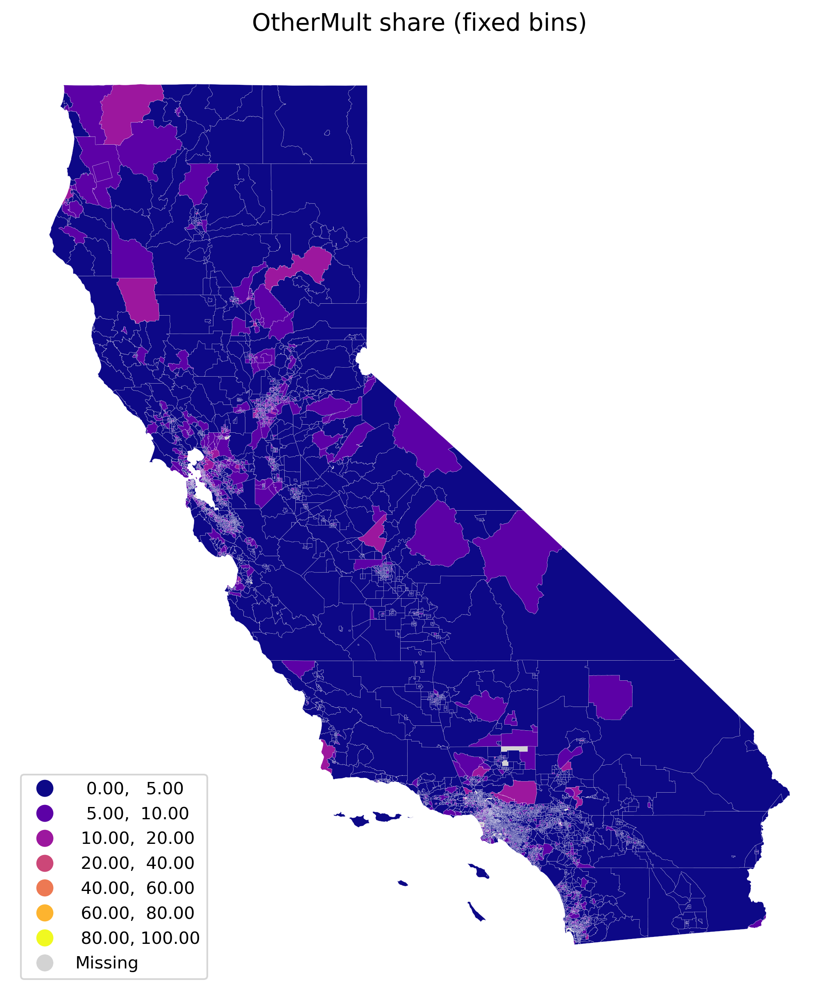

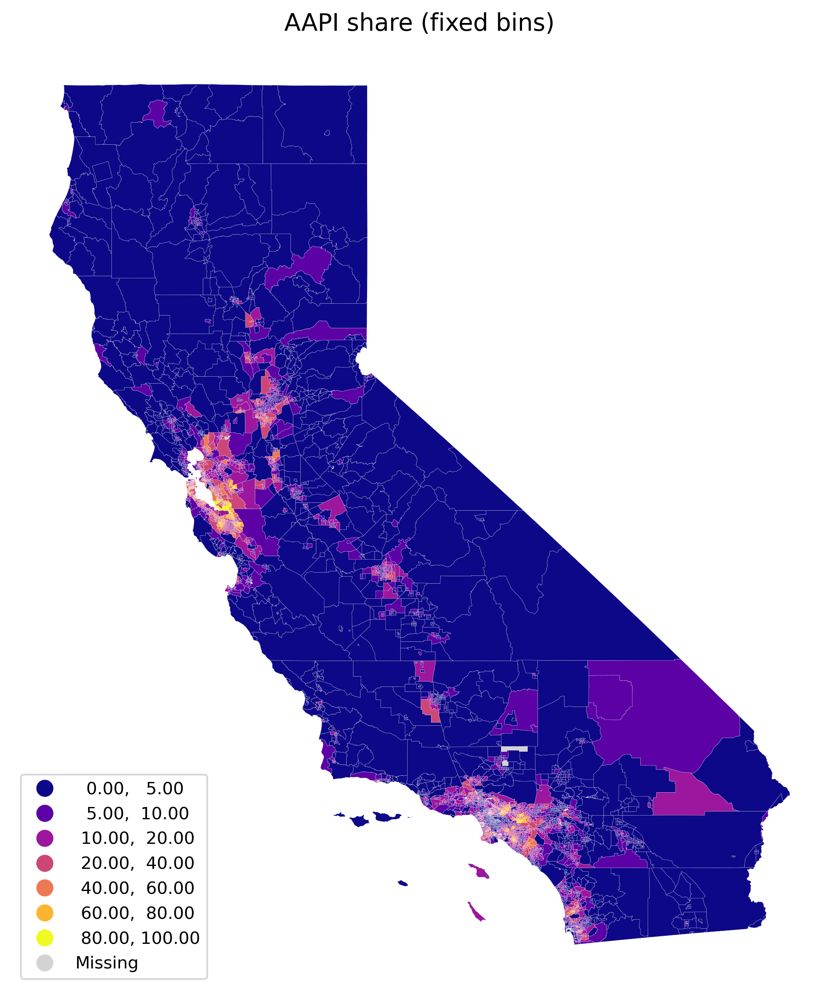

In [8]:
MAP_DIR = Path("visualizations/descriptive_maps")

race_cols = ['Hispanic','White','AfricanAm','NativeAm','OtherMult','AAPI']
burden = "CIscoreP"

display(Markdown("## Race share (fixed bins)"))
for r in race_cols:
    display(Image(filename=str(MAP_DIR / f"race_{r}_fixedbins.png"), width=300))

These fixed-bin maps reveal strong spatial clustering in racial composition across California. Hispanic population shares are highest in the Central Valley, Inland Empire, and parts of Southern California, while White population shares are comparatively higher in many rural and coastal counties, particularly in the northern and eastern parts of the state. African American population shares are generally low statewide but show clear concentration in specific urban areas, especially parts of the Bay Area and Los Angeles County. Native American population shares are small overall, with higher values appearing in select rural and inland regions. The “Other/Multiracial” category remains low across most tracts, with modest clustering in urban and suburban areas. In contrast, AAPI population shares are highly concentrated in major metropolitan regions, notably the Bay Area and Southern California, highlighting the pronounced urban concentration of Asian American and Pacific Islander communities. Using fixed bins across all maps allows for direct comparison across groups, making clear that racial composition in California is not evenly distributed but instead reflects distinct regional and urban patterns.

## Bivariate maps

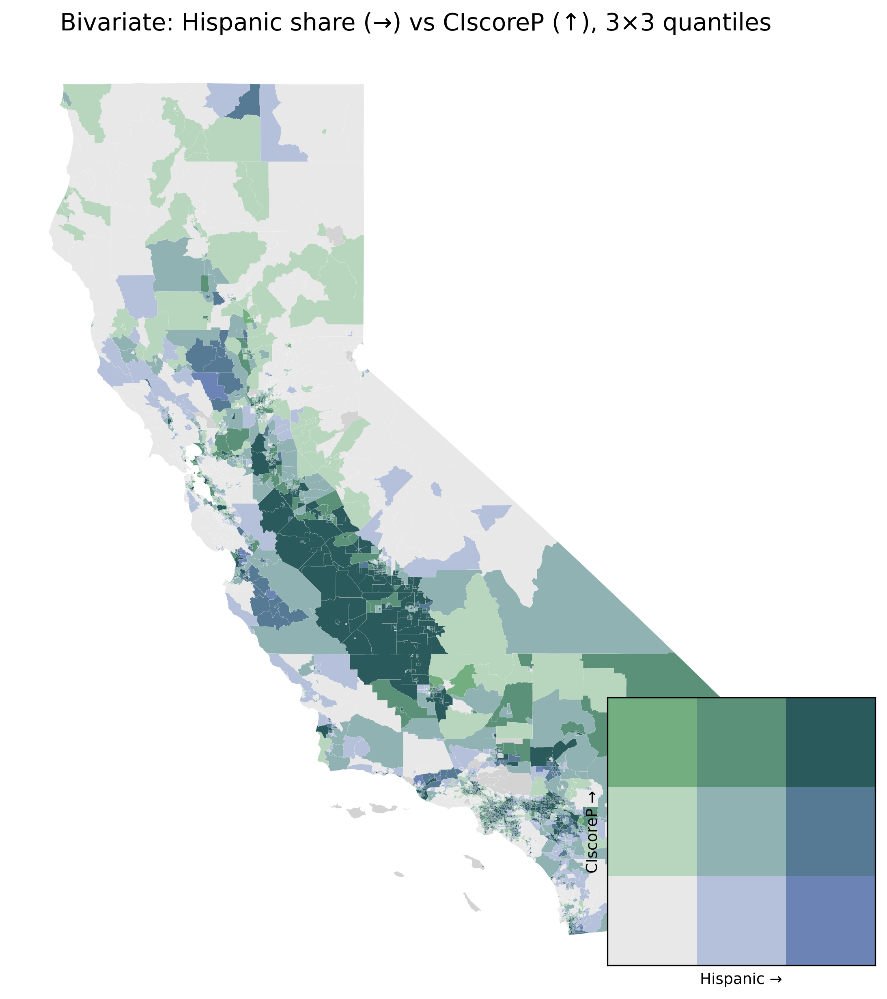

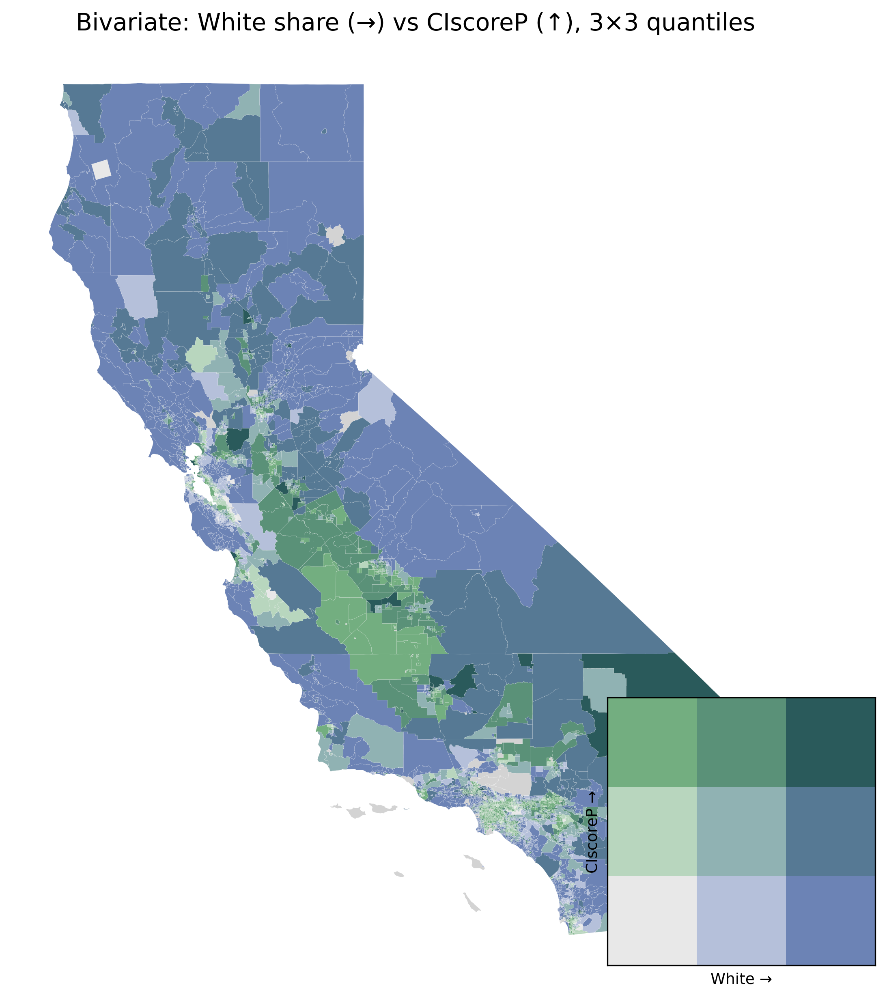

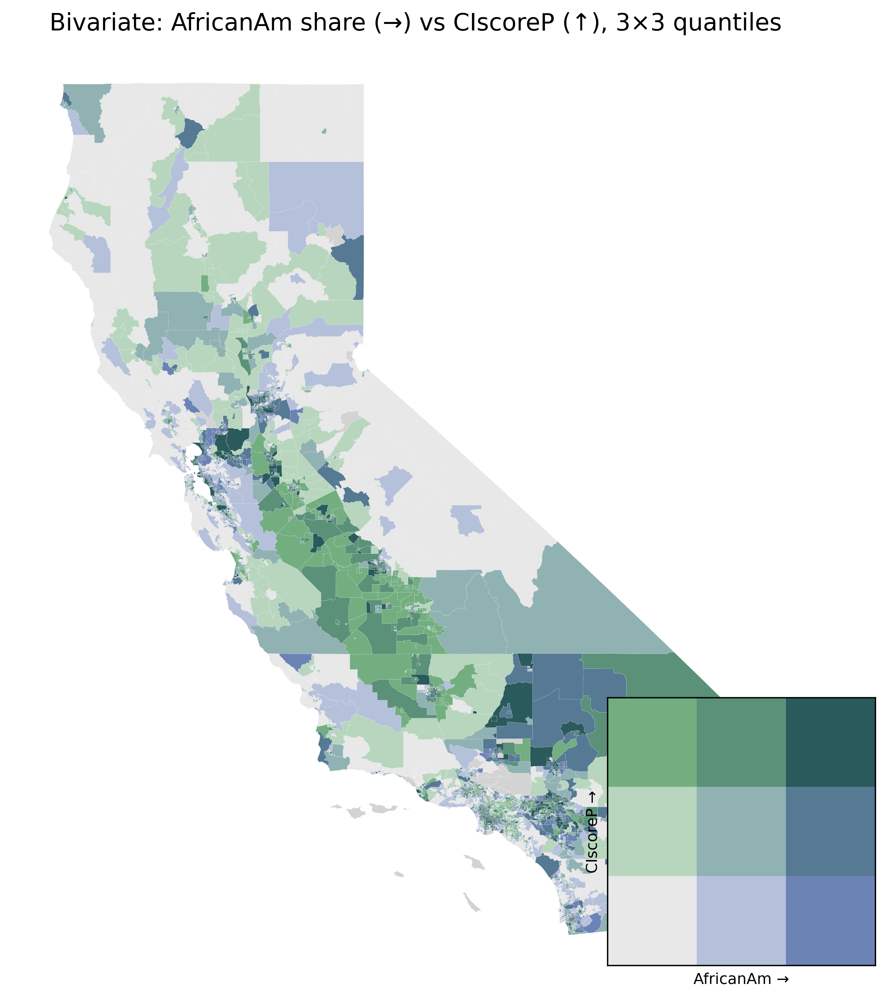

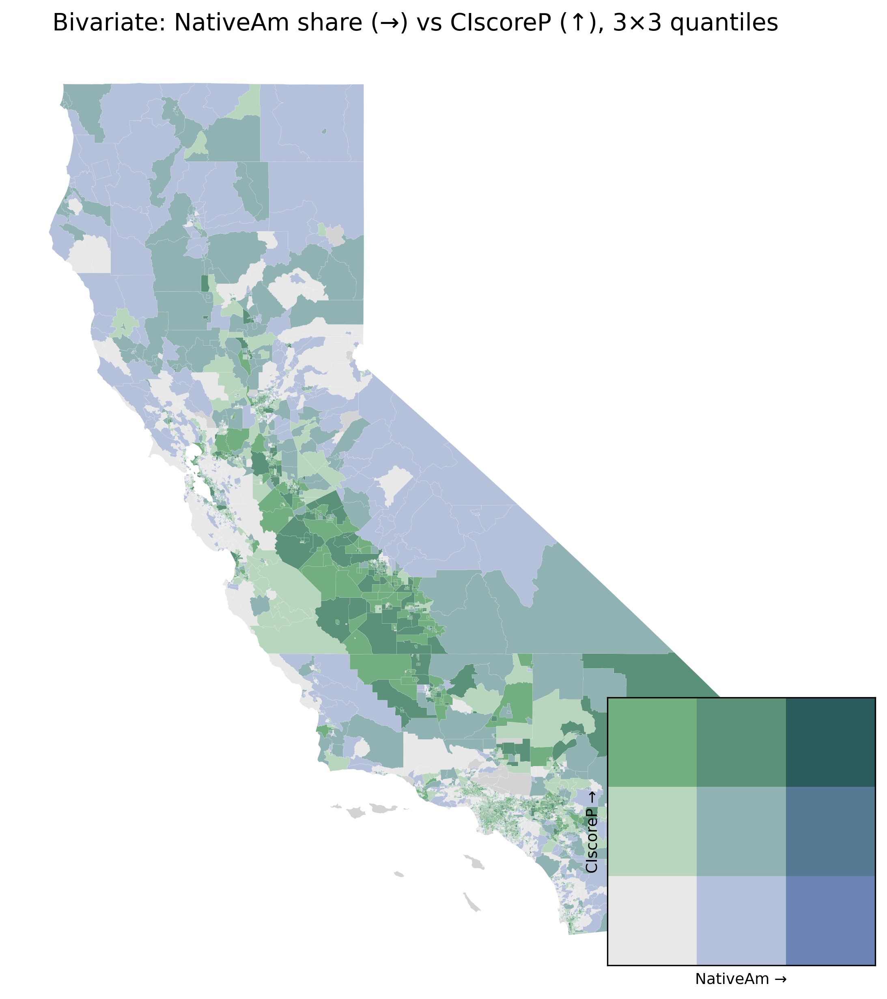

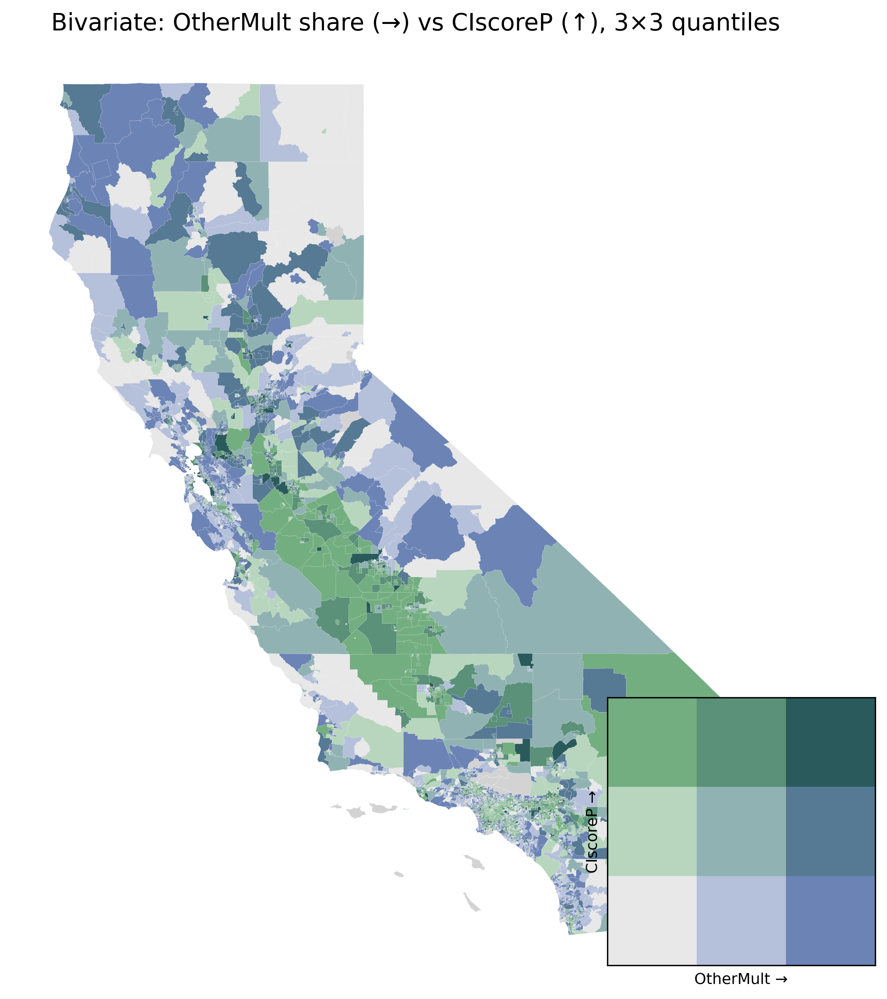

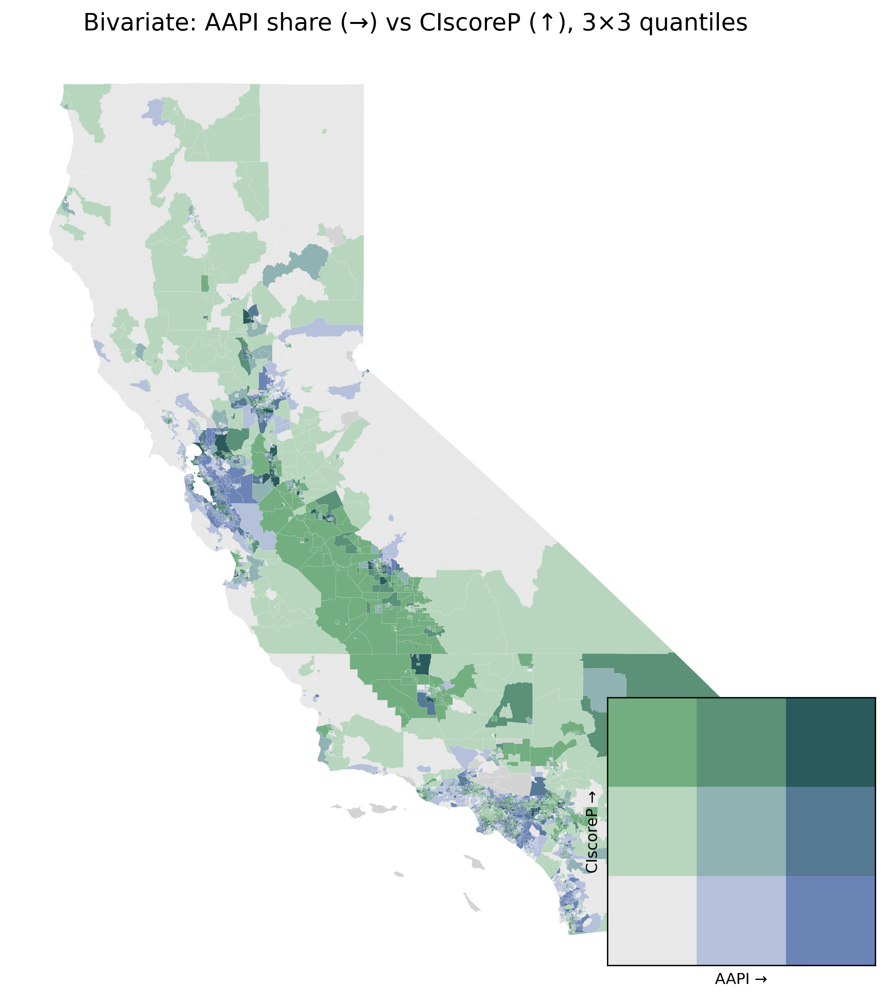

In [9]:
display(Markdown("## Bivariate maps"))
for r in race_cols:
    display(Image(filename=str(MAP_DIR / f"bivariate_{r}_{burden}.png"), width=300))


The bivariate maps make it clear that the relationship between racial composition and cumulative environmental burden differs substantially across groups. Census tracts with higher Hispanic population shares are disproportionately represented in the highest CI score categories, particularly across the Central Valley, Inland Empire, and Southern California, indicating a strong spatial overlap between Hispanic concentration and elevated cumulative pollution and population vulnerability. In contrast, tracts with higher White population shares are more likely to fall into the lowest CI score categories, suggesting that predominantly White areas experience comparatively lower cumulative environmental impacts. For African American populations, the association with CI scores is more localized: while overall population shares are low statewide, areas with higher African American concentrations in major metropolitan regions (especially in Los Angeles and the Bay Area) tend to coincide with higher CI scores. Native American population shares show a weaker and more heterogeneous relationship with CI scores, reflecting their concentration in rural and inland regions with mixed levels of cumulative impact rather than consistently high or low burden. The Other/Multiracial category displays modest alignment with higher CI scores in urban and suburban tracts, though patterns are less pronounced. Finally, AAPI population shares are concentrated in urban coastal regions where CI scores span the distribution, indicating that high AAPI concentration does not systematically correspond to the highest cumulative environmental burdens. Overall, these maps underscore that environmental exposure in California is unevenly distributed across racial groups, with particularly strong disparities affecting Hispanic communities.

## Overlap hotspots

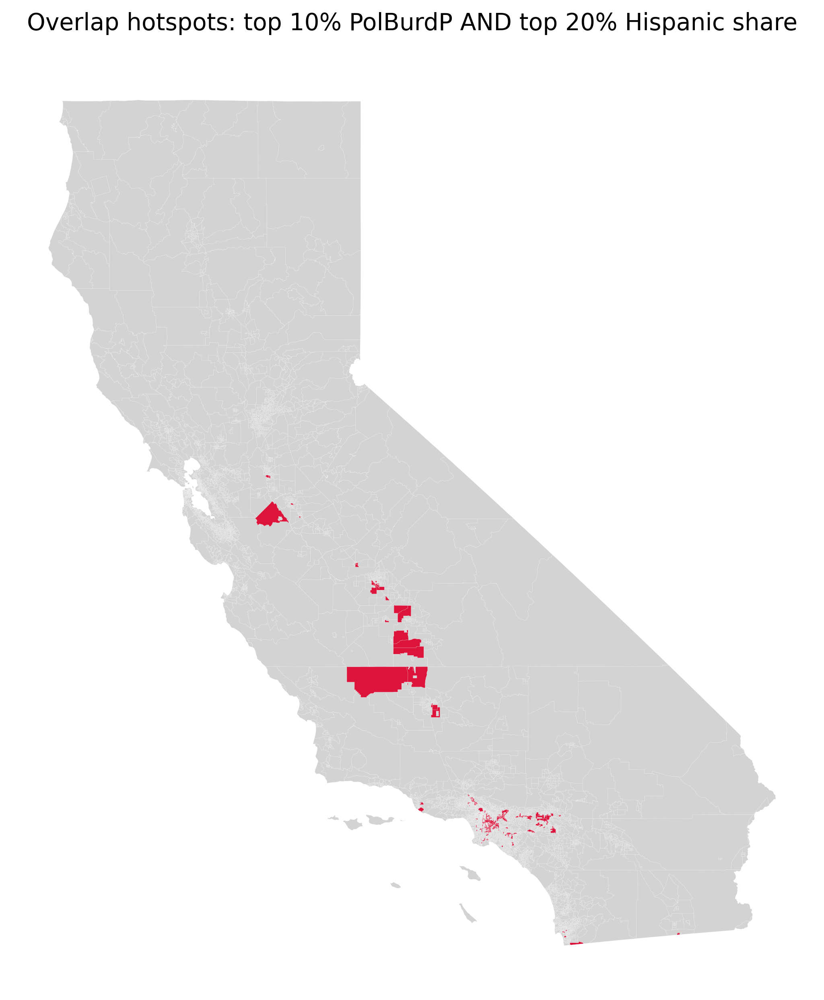

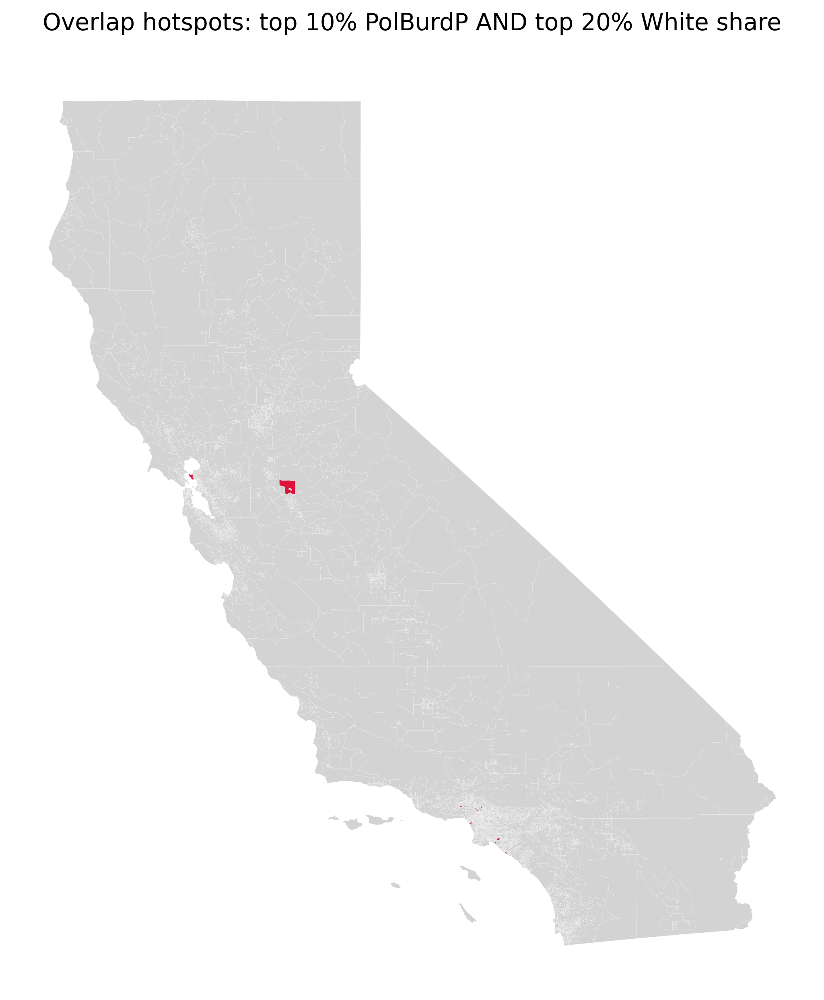

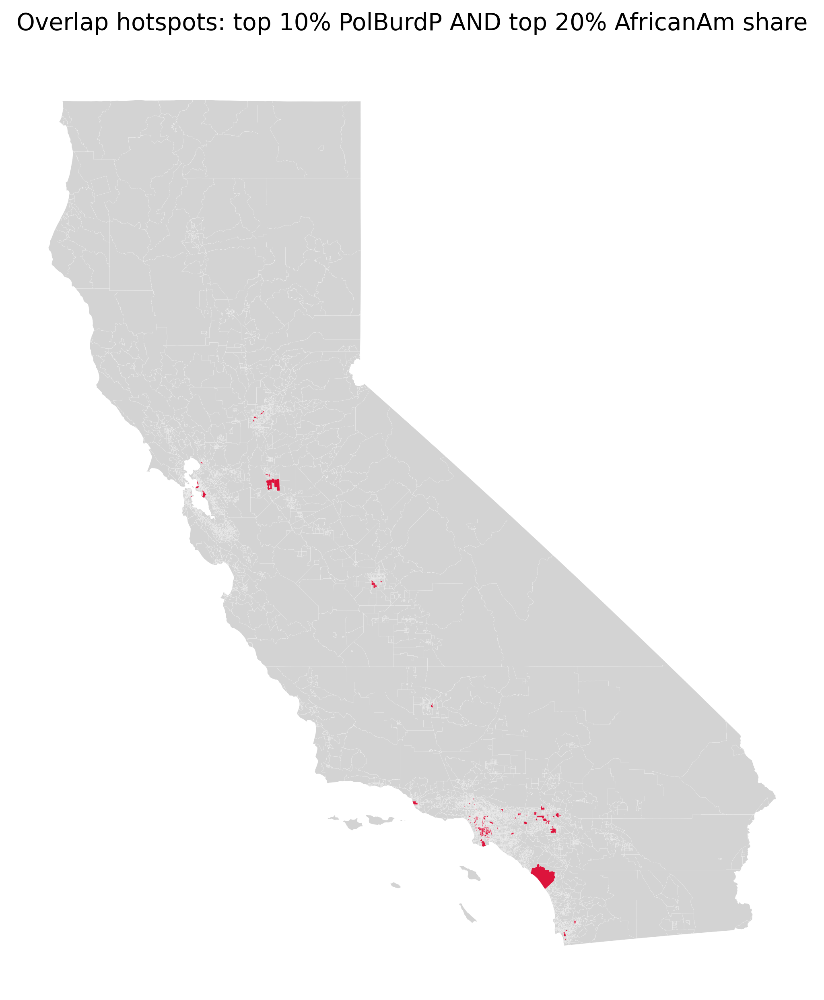

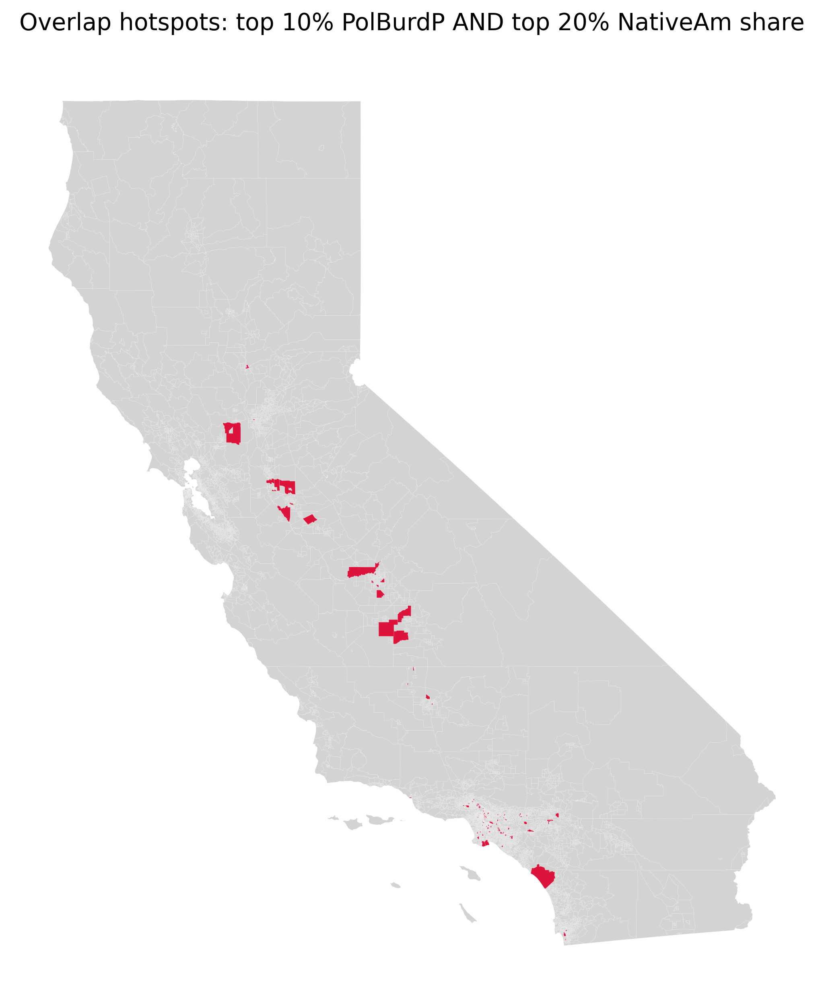

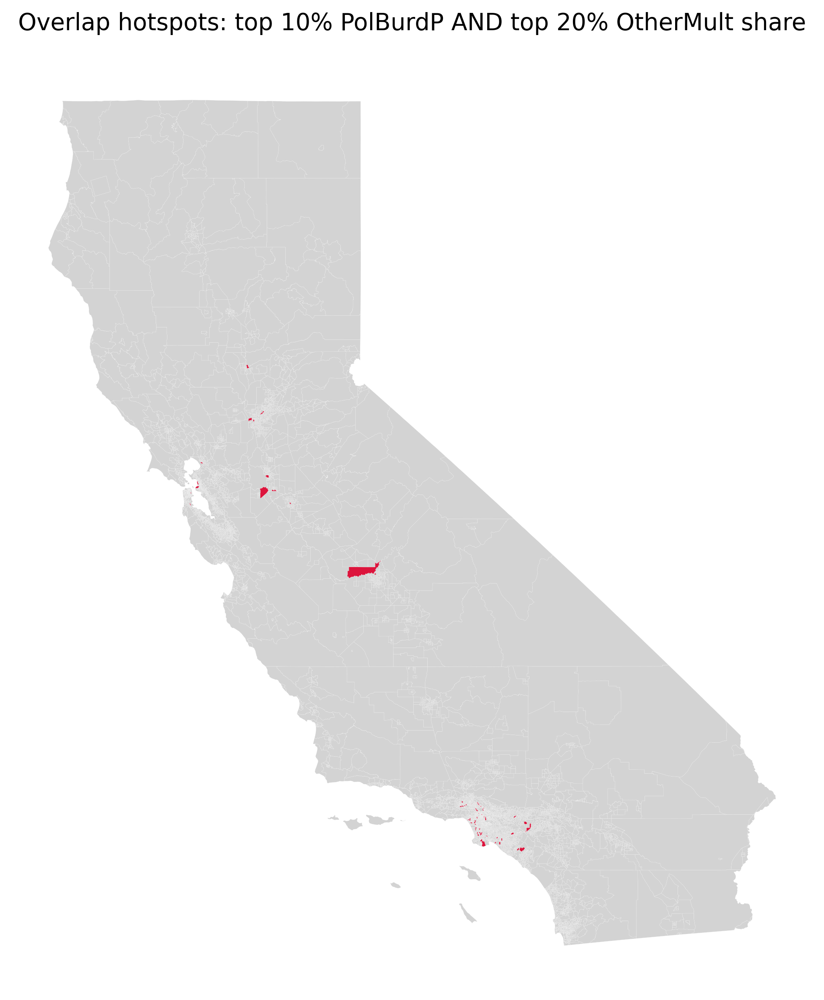

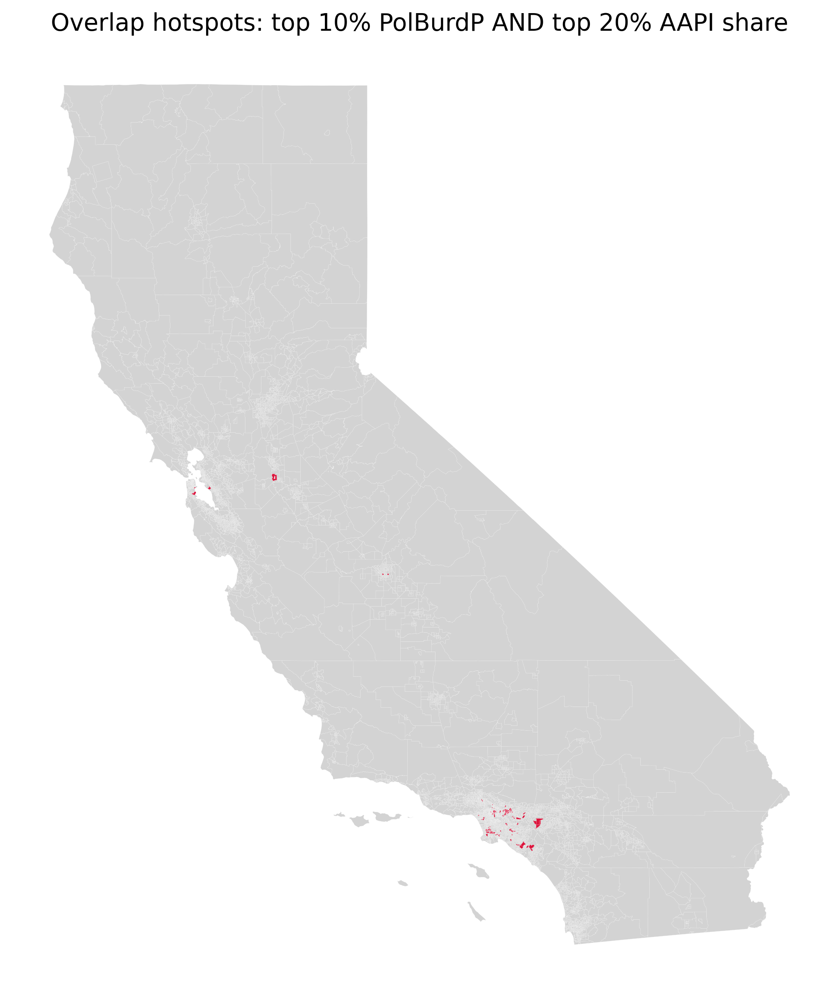

In [6]:
display(Markdown("## Overlap hotspots"))
for r in race_cols:
    display(Image(filename=str(MAP_DIR / f"overlap_hotspots_{r}_{burden}.png"), width=300))

The overlap hotspot maps identify census tracts that fall simultaneously in the top 10% of pollution burden and the top 20% of racial population share, making disparities in extreme exposure especially visible. Hotspots are most extensive for Hispanic populations, with large and contiguous clusters appearing in the Central Valley, Inland Empire, and parts of Southern California, indicating that heavily Hispanic communities are disproportionately represented among the most pollution-burdened areas in the state. In contrast, overlap hotspots for White population share are rare and highly dispersed, suggesting that predominantly White tracts are largely absent from the most extreme pollution burden categories. African American overlap hotspots are limited in number but clearly concentrated in specific urban regions, particularly in parts of Los Angeles County and the Bay Area, pointing to localized but severe exposure within major metropolitan areas. Native American overlap hotspots appear in select inland and rural regions, reflecting elevated pollution burdens in a smaller number of tracts with relatively high Native American population shares rather than widespread overlap. The Other/Multiracial category shows sparse and fragmented hotspots, primarily in urban areas, indicating weaker alignment with the most extreme pollution burdens. Finally, AAPI overlap hotspots are minimal and geographically constrained, reinforcing that high AAPI population shares do not systematically coincide with the highest pollution burden tracts. Overall, these overlap maps highlight that the most severe cumulative pollution burdens in California are disproportionately concentrated in Hispanic communities, while exposure among other groups tends to be more localized or limited in scope.

## Author Contributions:
